In [ ]:
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
import io
import zipfile
# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [ ]:
file_id = '1PhW_HMPVN4OY-JR3ZUokdh0vvKjRCthR' #-- Updated File ID for my zip
file_obj = drive.CreateFile({'id': file_id})
file_obj.GetContentFile('zipdata.zip') 

In [ ]:
import pandas as pd
import numpy as np
import zipfile

In [ ]:
file_obj

In [ ]:
archive = zipfile.ZipFile('zipdata.zip', 'r')
xlfile = archive.open('PowerBIData.xlsx')
df = pd.read_excel(xlfile, sheet_name='PA - Driving Safety', index_col=False)

In [ ]:
df.dtypes

State                                                  object
Year                                                    int64
Miles (millions)                                      float64
Fatalities                                              int64
Deaths per 100 million vehicle miles traveled         float64
Target                                                float64
2018 Deaths per 100 million vehicle miles traveled    float64
dtype: object

In [ ]:
df.head()

,State,Year,Miles (millions),Fatalities,Deaths per 100 million vehicle miles traveled,Target,2018 Deaths per 100 million vehicle miles traveled
0,Alabama,2018,71167.206754,953,1.339100,725.905509,1.3391
1,Alabama,2017,70677.248200,948,1.341309,720.907932,0.0000
2,Alabama,2016,69226.970805,1083,1.564419,706.115102,0.0000
3,Alabama,2015,67257.004645,850,1.263809,686.021447,0.0000
4,Alabama,2014,65666.604321,820,1.248732,669.799364,0.0000


In [ ]:
pip install dataprep

In [ ]:
from dataprep.eda import create_report
from dataprep.eda import plot
from dataprep.eda import plot_correlation
from dataprep.eda import plot_missing


In [ ]:
plot(df)


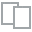
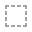
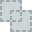
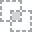
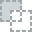
...
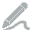
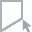
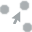
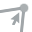
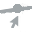

In [ ]:
plot_correlation(df)


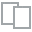
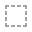
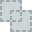
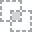
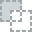
...
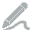
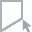
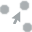
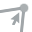
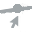

In [ ]:
plot(df, "Deaths per 100 million vehicle miles traveled")


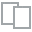
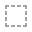
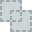
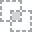
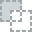
...
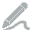
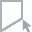
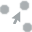
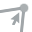
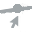

In [ ]:
plot(df, "State")

DataPrep Report
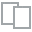
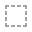
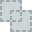
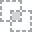
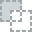
...
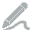
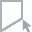
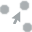
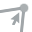
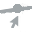

In [ ]:
report = create_report(df)
report

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

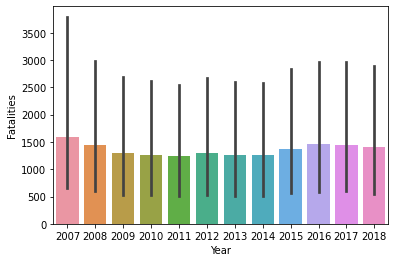

In [ ]:
sns.barplot(x = "Year", y = "Fatalities", data=df)

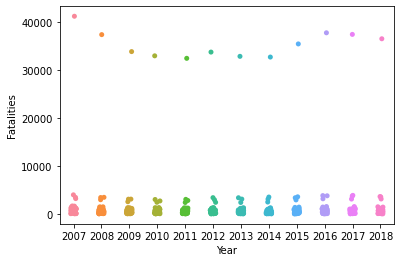

In [ ]:
sns.stripplot(x= "Year" , y= "Fatalities" , data=df)

In [ ]:
import plotly.express as px

In [ ]:
fig = px.bar(df, x='Year', y='Fatalities')
fig.show()

In [ ]:
import plotly.graph_objects as go
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 624 entries, 0 to 623
Data columns (total 7 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   State                                               624 non-null    object 
 1   Year                                                624 non-null    int64  
 2   Miles (millions)                                    624 non-null    float64
 3   Fatalities                                          624 non-null    int64  
 4   Deaths per 100 million vehicle miles traveled       624 non-null    float64
 5   Target                                              624 non-null    float64
 6   2018 Deaths per 100 million vehicle miles traveled  624 non-null    float64
dtypes: float64(4), int64(2), object(1)
memory usage: 34.2+ KB


In [ ]:
df1 = df.drop(['Deaths per 100 million vehicle miles traveled', 'Target', '2018 Deaths per 100 million vehicle miles traveled'], axis = 1)

In [ ]:
df1

,State,Year,Miles (millions),Fatalities
0,Alabama,2018,7.116721e+04,953
1,Alabama,2017,7.067725e+04,948
2,Alabama,2016,6.922697e+04,1083
3,Alabama,2015,6.725700e+04,850
4,Alabama,2014,6.566660e+04,820
...,...,...,...,...
619,US Overall,2011,2.950402e+06,32479
620,US Overall,2010,2.967266e+06,32999
621,US Overall,2009,2.956764e+06,33883
622,US Overall,2008,2.973509e+06,37423


In [ ]:
import plotly.figure_factory as ff

fig = ff.create_table(df1, index='Year')

# Make text size larger
for i in range(len(fig.layout.annotations)):
    fig.layout.annotations[i].font.size = 20

fig.show()

In [ ]:
df1.reset_index()
df1=df1.drop(['index'],axis=1)


KeyError: ignored

In [ ]:
df1

,State,Year,Miles (millions),Fatalities
0,Alabama,2018,7.116721e+04,953
1,Alabama,2017,7.067725e+04,948
2,Alabama,2016,6.922697e+04,1083
3,Alabama,2015,6.725700e+04,850
4,Alabama,2014,6.566660e+04,820
...,...,...,...,...
619,US Overall,2011,2.950402e+06,32479
620,US Overall,2010,2.967266e+06,32999
621,US Overall,2009,2.956764e+06,33883
622,US Overall,2008,2.973509e+06,37423


In [ ]:
df1.set_index('State', inplace=True)
print (df1)

            Year  Miles (millions)  Fatalities
State                                         
Alabama     2018      7.116721e+04         953
Alabama     2017      7.067725e+04         948
Alabama     2016      6.922697e+04        1083
Alabama     2015      6.725700e+04         850
Alabama     2014      6.566660e+04         820
...          ...               ...         ...
US Overall  2011      2.950402e+06       32479
US Overall  2010      2.967266e+06       32999
US Overall  2009      2.956764e+06       33883
US Overall  2008      2.973509e+06       37423
US Overall  2007      3.029822e+06       41259

[624 rows x 3 columns]


In [ ]:
df3 = df1.drop("US Overall")

In [ ]:
import plotly.figure_factory as ff

fig = ff.create_table(df3, index=True)

# Make text size larger
for i in range(len(fig.layout.annotations)):
    fig.layout.annotations[i].font.size = 20

fig.show()